<figure>
  <IMG src="figures/logo-esi-sba.png" WIDTH=300 height="100" ALIGN="right">
</figure>

# Practical Trainining Series on Software Engineering For Data Science  
*By Dr. Belkacem KHALDI (b.khaldi@esi-sba.dz)*

# Notebook 7: Data Processing & Cleaning for Data Science: Exploratory Data Analysis and Visualization– Going Deeper
The purpose of this [Jupyter Notebook] is to getting you go deeper on Data Processing & Cleaning for Data
Science. It provides a set of practical Training challenges that allow grasping the different concepts presented in  lecture 7.

## EDA

### Challenge 1:  iTunes dataset
Using the iTunes dataset existed in the /data folder of this notebook, you are asked to  proceed with the  exploratory data analysis and visulaization techniques seen in lecture 7 to provide a clean dataset as well as to report a small summary of your EDA results to your team.

The EDA should be done using a visualization technique rather than using the basic EDA procedures seen in Lecture 5.
See Test from Slide 4 to 16.

Report the possible high correlation found from your visualization EDA.


**Importing the necessary libraries**

In [2]:
#Your Solution here
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import time


data = pd.read_csv('data/itunes_data.csv')
data

,Track,Composer,Milliseconds,Bytes,UnitPrice,Genre,Album,Artist
0,For Those About To Rock (We Salute You),"Angus Young, Malcolm Young, Brian Johnson",343719,11170334,0.99,Rock,For Those About To Rock We Salute You,AC/DC
1,Put The Finger On You,"Angus Young, Malcolm Young, Brian Johnson",205662,6713451,0.99,Rock,For Those About To Rock We Salute You,AC/DC
2,Let's Get It Up,"Angus Young, Malcolm Young, Brian Johnson",233926,7636561,0.99,Rock,For Those About To Rock We Salute You,AC/DC
3,Inject The Venom,"Angus Young, Malcolm Young, Brian Johnson",210834,6852860,0.99,Rock,For Those About To Rock We Salute You,AC/DC
4,Snowballed,"Angus Young, Malcolm Young, Brian Johnson",203102,6599424,0.99,Rock,For Those About To Rock We Salute You,AC/DC
...,...,...,...,...,...,...,...,...
3498,Pini Di Roma (Pinien Von Rom) \ I Pini Della V...,NaN,286741,4718950,0.99,Classical,Respighi:Pines of Rome,Eugene Ormandy
3499,"String Quartet No. 12 in C Minor, D. 703 ""Quar...",Franz Schubert,139200,2283131,0.99,Classical,Schubert: The Late String Quartets & String Qu...,Emerson String Quartet
3500,"L'orfeo, Act 3, Sinfonia (Orchestra)",Claudio Monteverdi,66639,1189062,0.99,Classical,Monteverdi: L'Orfeo,"C. Monteverdi, Nigel Rogers - Chiaroscuro; Lon..."
3501,"Quintet for Horn, Violin, 2 Violas, and Cello ...",Wolfgang Amadeus Mozart,221331,3665114,0.99,Classical,Mozart: Chamber Music,Nash Ensemble


In [2]:
## printing all columns
coll = data.columns
print(coll)

Index(['Track', 'Composer', 'Milliseconds', 'Bytes', 'UnitPrice', 'Genre',
       'Album', 'Artist'],
      dtype='object')


In [3]:
data.describe()

,Milliseconds,Bytes,UnitPrice
count,3.503000e+03,3.503000e+03,3503.000000
mean,3.935992e+05,3.351021e+07,1.050805
std,5.350054e+05,1.053925e+08,0.239006
min,1.071000e+03,3.874700e+04,0.990000
25%,2.072810e+05,6.342566e+06,0.990000
50%,2.556340e+05,8.107896e+06,0.990000
75%,3.216450e+05,1.026679e+07,0.990000
max,5.286953e+06,1.059546e+09,1.990000


The dataset contains `8` features,`3` of them are numeric

In [4]:
print(data.info())
print('\n')
print(data.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3503 entries, 0 to 3502
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Track         3503 non-null   object 
 1   Composer      2525 non-null   object 
 2   Milliseconds  3503 non-null   int64  
 3   Bytes         3503 non-null   int64  
 4   UnitPrice     3503 non-null   float64
 5   Genre         3503 non-null   object 
 6   Album         3503 non-null   object 
 7   Artist        3503 non-null   object 
dtypes: float64(1), int64(2), object(5)
memory usage: 219.1+ KB
None


Track             0
Composer        978
Milliseconds      0
Bytes             0
UnitPrice         0
Genre             0
Album             0
Artist            0
dtype: int64


*Only the `Composer` feature contains `978` null values*

**Dimensional Analysis (DA)**

In [5]:
data['Minutes'] = data['Milliseconds'] / (1000 * 60)
data['MB'] = data['Bytes'] / 1000000
data.drop(['Milliseconds', 'Bytes'], axis=1, inplace=True)

In [6]:
data.head()

,Track,Composer,UnitPrice,Genre,Album,Artist,Minutes,MB
0,For Those About To Rock (We Salute You),"Angus Young, Malcolm Young, Brian Johnson",0.99,Rock,For Those About To Rock We Salute You,AC/DC,5.728650,11.170334
1,Put The Finger On You,"Angus Young, Malcolm Young, Brian Johnson",0.99,Rock,For Those About To Rock We Salute You,AC/DC,3.427700,6.713451
2,Let's Get It Up,"Angus Young, Malcolm Young, Brian Johnson",0.99,Rock,For Those About To Rock We Salute You,AC/DC,3.898767,7.636561
3,Inject The Venom,"Angus Young, Malcolm Young, Brian Johnson",0.99,Rock,For Those About To Rock We Salute You,AC/DC,3.513900,6.852860
4,Snowballed,"Angus Young, Malcolm Young, Brian Johnson",0.99,Rock,For Those About To Rock We Salute You,AC/DC,3.385033,6.599424


***Boxplots***

/var/folders/qh/q0gs86q124x9czkvbyj6hkf00000gn/T/ipykernel_2630/523547042.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_std = (numeric - numeric.mean()) / numeric.std()


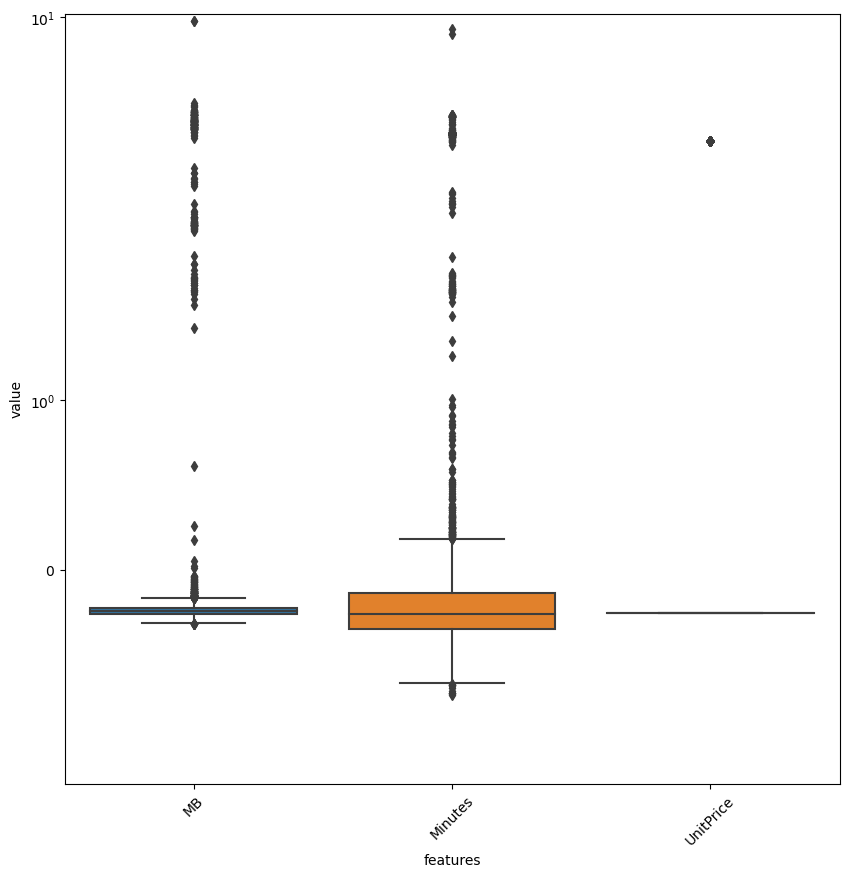

In [7]:
numeric = data[['UnitPrice', 'Minutes', 'MB', 'Genre']]
data_std = (numeric - numeric.mean()) / numeric.std()
data_std = pd.melt(data_std, id_vars='Genre',
              var_name='features',
              value_name='value')
plt.figure(figsize=(10, 10))
sns.boxplot(x='features', y='value', data=data_std)
plt.xticks(rotation=45)
plt.yscale('symlog')

***Letter-Value Plots***

Text(0.5, 1.0, 'Logarithmic Scale')

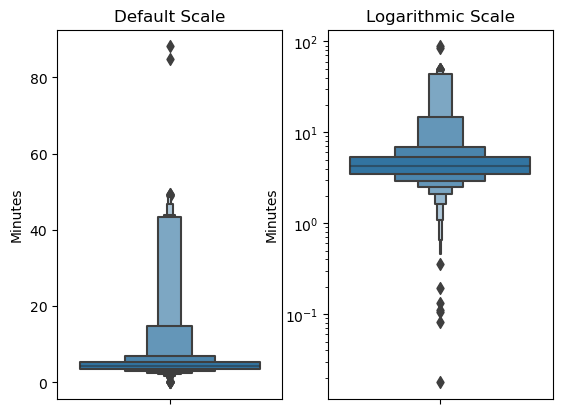

In [8]:
fig, axes = plt.subplots(nrows=1, ncols=2)
sns.boxenplot(y=data['Minutes'],ax=axes[0])
sns.boxenplot(y=data['Minutes'],ax=axes[1])


plt.yscale('log')
axes[0].set_title("Default Scale")
axes[1].set_title("Logarithmic Scale")

***Histograms Plots***

<AxesSubplot:xlabel='Minutes', ylabel='Count'>

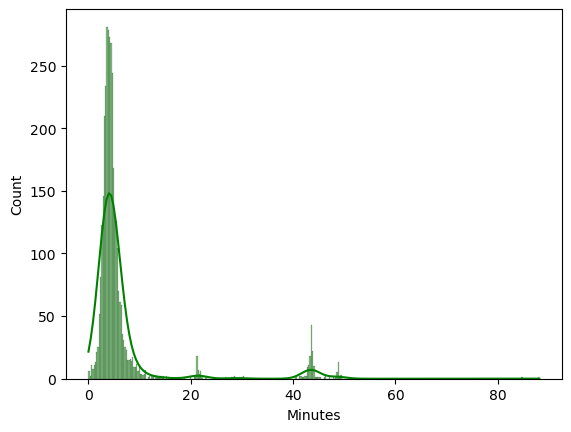

In [9]:
sns.histplot(x=data['Minutes'], kde=True, color='green')

***Violin Plots***

Per columns

(array([0, 1, 2]),
 [Text(0, 0, 'MB'), Text(1, 0, 'Minutes'), Text(2, 0, 'UnitPrice')])

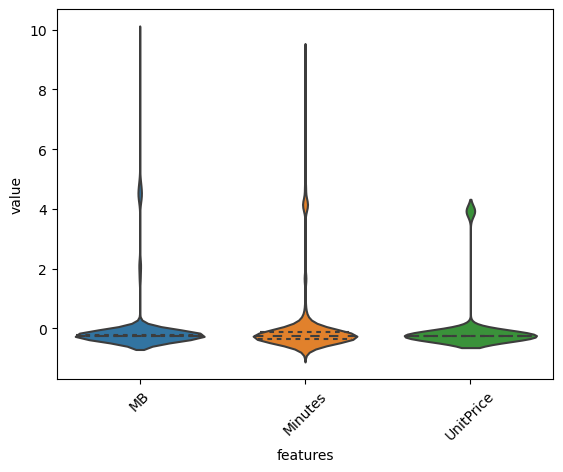

In [10]:
sns.violinplot(x='features', y='value', data=data_std, inner='quart')
plt.xticks(rotation=45)

Plotting the top 5 genres by Minutes of songs length.

<AxesSubplot:xlabel='Minutes', ylabel='Genre'>

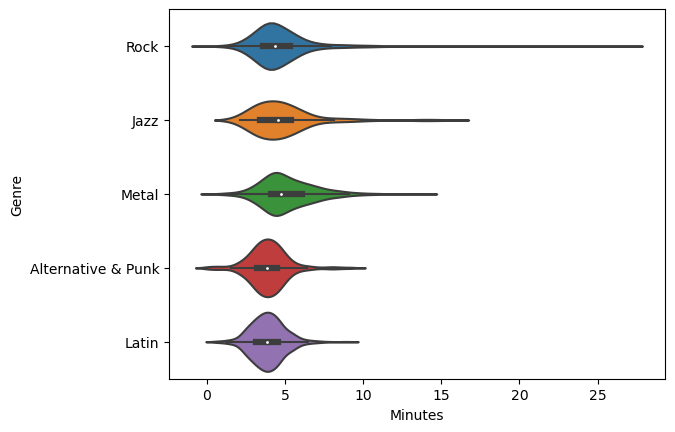

In [11]:
top_5_genres = data['Genre'].value_counts().index[:5]
top_5_data = data[data['Genre'].isin(top_5_genres)]
sns.violinplot(data=top_5_data, x='Minutes', y='Genre')

***Scatter Plots***

<AxesSubplot:xlabel='Minutes', ylabel='MB'>

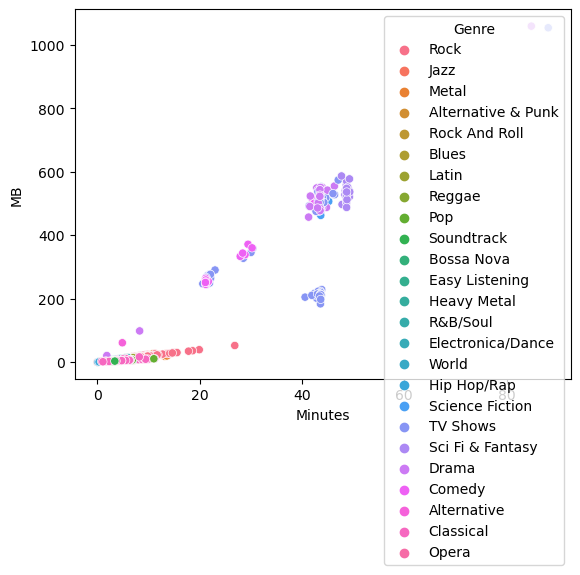

In [13]:
sns.scatterplot(data=data, x='Minutes', y='MB', hue='Genre')

***Correlogram***

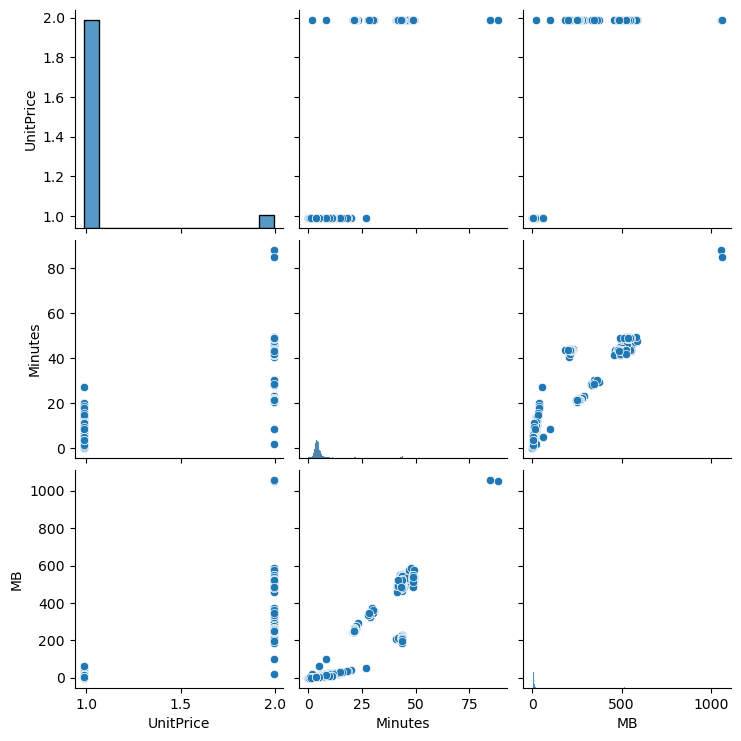

In [14]:
sns.pairplot(data=data)

***Correlating Matrix***

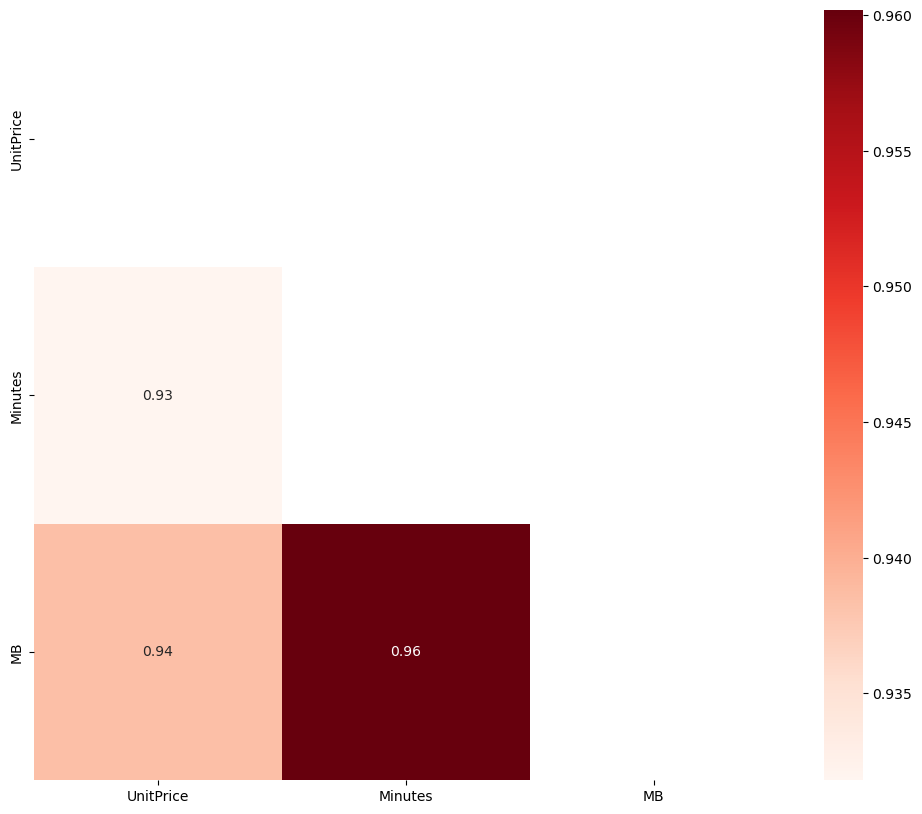

In [15]:
plt.figure(figsize=(12,10))
cor = data.corr()
mask = np.triu(np.ones_like(cor))
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, mask=mask)
plt.show()

<AxesSubplot:>

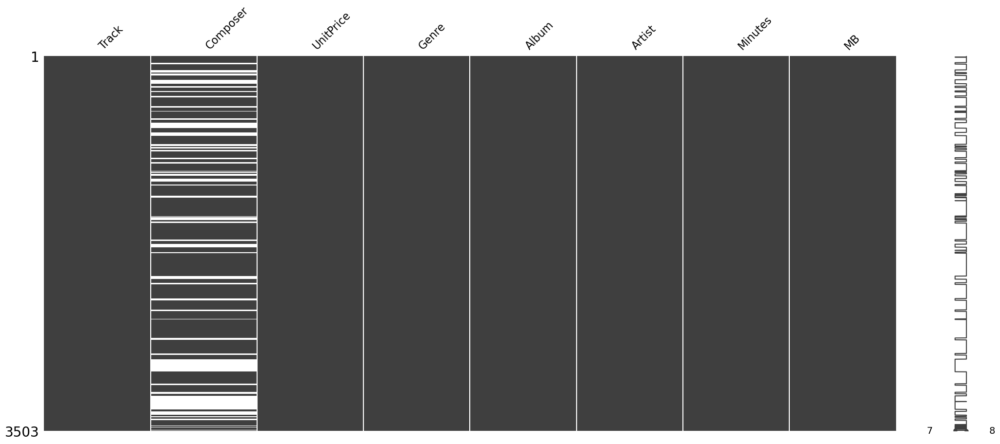

In [17]:
import missingno as msno
msno.matrix(data)

***pandas- profiling EDA***

In [20]:
!pip install pandas_profiling

ERROR: Could not find a version that satisfies the requirement pandas_profiling (from versions: none)
ERROR: No matching distribution found for pandas_profiling


In [19]:
from pandas_profiling import ProfileReport
report = ProfileReport(df)
Report #or

ModuleNotFoundError: No module named 'pandas_profiling'

### Challenge 2: hous_pricing dataset 

Do the EDA and visualization procedures to explore the data/hous_pricing dataset.

Report the possible high correlation found from your visualization EDA.


In [3]:
data = pd.read_csv('data/house_pricing.csv')
data.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [4]:
## printing all columns
coll = data.columns
print(coll, len(coll))

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'street', 'city',
       'statezip', 'country'],
      dtype='object') 18


In [5]:
data.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated
count,4.600000e+03,4600.000000,4600.000000,4600.000000,4.600000e+03,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000,4600.000000
mean,5.519630e+05,3.400870,2.160815,2139.346957,1.485252e+04,1.512065,0.007174,0.240652,3.451739,1827.265435,312.081522,1970.786304,808.608261
std,5.638347e+05,0.908848,0.783781,963.206916,3.588444e+04,0.538288,0.084404,0.778405,0.677230,862.168977,464.137228,29.731848,979.414536
min,0.000000e+00,0.000000,0.000000,370.000000,6.380000e+02,1.000000,0.000000,0.000000,1.000000,370.000000,0.000000,1900.000000,0.000000
25%,3.228750e+05,3.000000,1.750000,1460.000000,5.000750e+03,1.000000,0.000000,0.000000,3.000000,1190.000000,0.000000,1951.000000,0.000000
50%,4.609435e+05,3.000000,2.250000,1980.000000,7.683000e+03,1.500000,0.000000,0.000000,3.000000,1590.000000,0.000000,1976.000000,0.000000
75%,6.549625e+05,4.000000,2.500000,2620.000000,1.100125e+04,2.000000,0.000000,0.000000,4.000000,2300.000000,610.000000,1997.000000,1999.000000
max,2.659000e+07,9.000000,8.000000,13540.000000,1.074218e+06,3.500000,1.000000,4.000000,5.000000,9410.000000,4820.000000,2014.000000,2014.000000


The dataset contains `18` features

In [5]:
print(data.info())
print('\n')
print(data.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4600 entries, 0 to 4599
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           4600 non-null   object 
 1   price          4600 non-null   float64
 2   bedrooms       4600 non-null   float64
 3   bathrooms      4600 non-null   float64
 4   sqft_living    4600 non-null   int64  
 5   sqft_lot       4600 non-null   int64  
 6   floors         4600 non-null   float64
 7   waterfront     4600 non-null   int64  
 8   view           4600 non-null   int64  
 9   condition      4600 non-null   int64  
 10  sqft_above     4600 non-null   int64  
 11  sqft_basement  4600 non-null   int64  
 12  yr_built       4600 non-null   int64  
 13  yr_renovated   4600 non-null   int64  
 14  street         4600 non-null   object 
 15  city           4600 non-null   object 
 16  statezip       4600 non-null   object 
 17  country        4600 non-null   object 
dtypes: float

***Boxplots***

/var/folders/qh/q0gs86q124x9czkvbyj6hkf00000gn/T/ipykernel_1446/3170960903.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data_std = (data - data.mean()) / data.std()


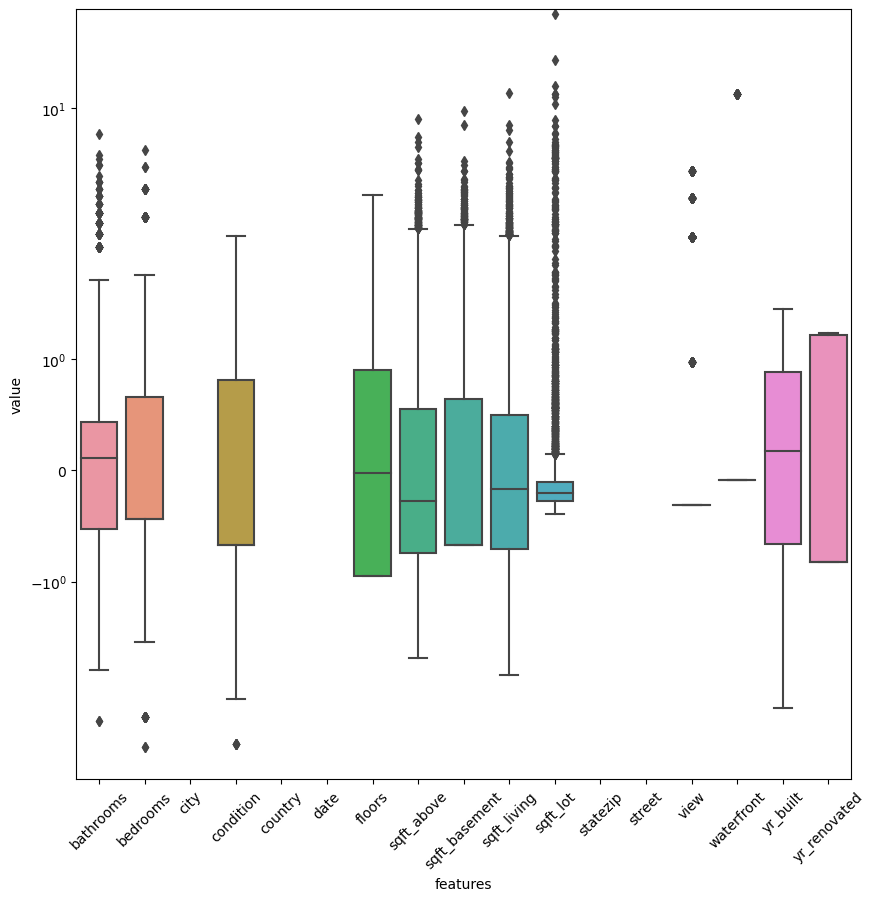

In [6]:
data_std = (data - data.mean()) / data.std()
data_std = pd.melt(data_std, id_vars='price',
              var_name='features',
              value_name='value')
plt.figure(figsize=(10, 10))
sns.boxplot(x='features', y='value', data=data_std)
plt.xticks(rotation=45)
plt.yscale('symlog')

***Letter-Value Plots***

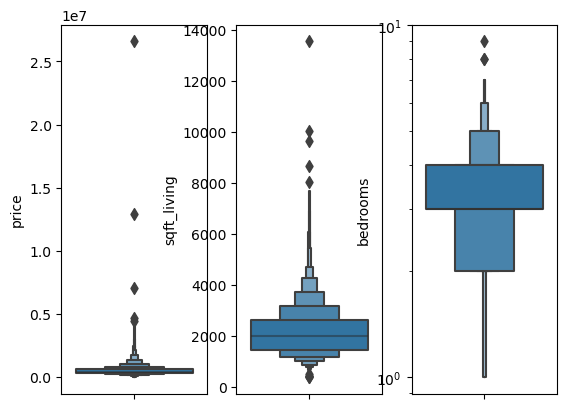

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=3)
sns.boxenplot(y=data['price'],ax=axes[0])
sns.boxenplot(y=data['sqft_living'],ax=axes[1])
sns.boxenplot(y=data['bedrooms'],ax=axes[2])


plt.yscale('log')

***Histograms Plots***

<AxesSubplot:xlabel='price', ylabel='Count'>

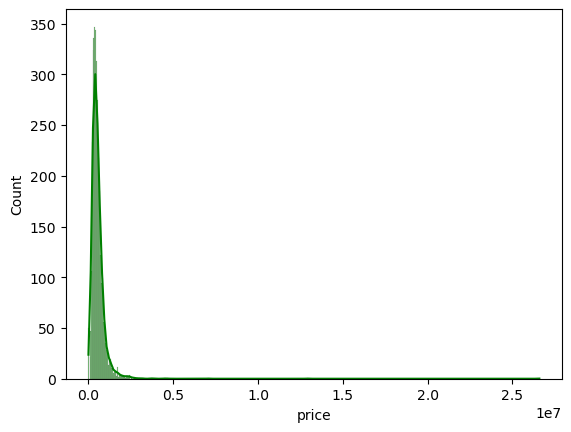

In [8]:
sns.histplot(x=data['price'], kde=True, color='green')

***Violin Plots***

Plotting the top 5 cities by price of house.

<AxesSubplot:xlabel='price', ylabel='city'>

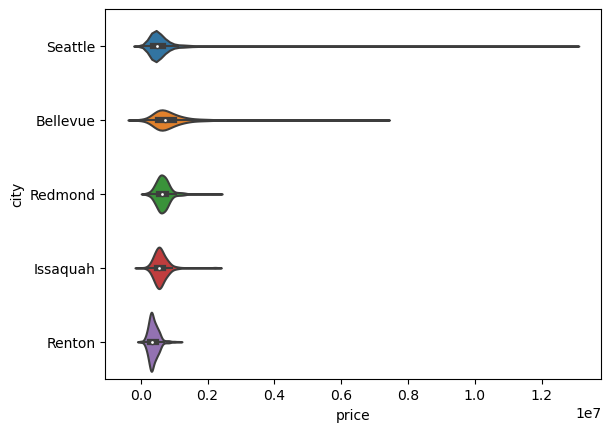

In [9]:
top_5_genres = data['city'].value_counts().index[:5]
top_5_data = data[data['city'].isin(top_5_genres)]
sns.violinplot(data=top_5_data, x='price', y='city')

***Scatter Plots***

<AxesSubplot:xlabel='sqft_living', ylabel='price'>

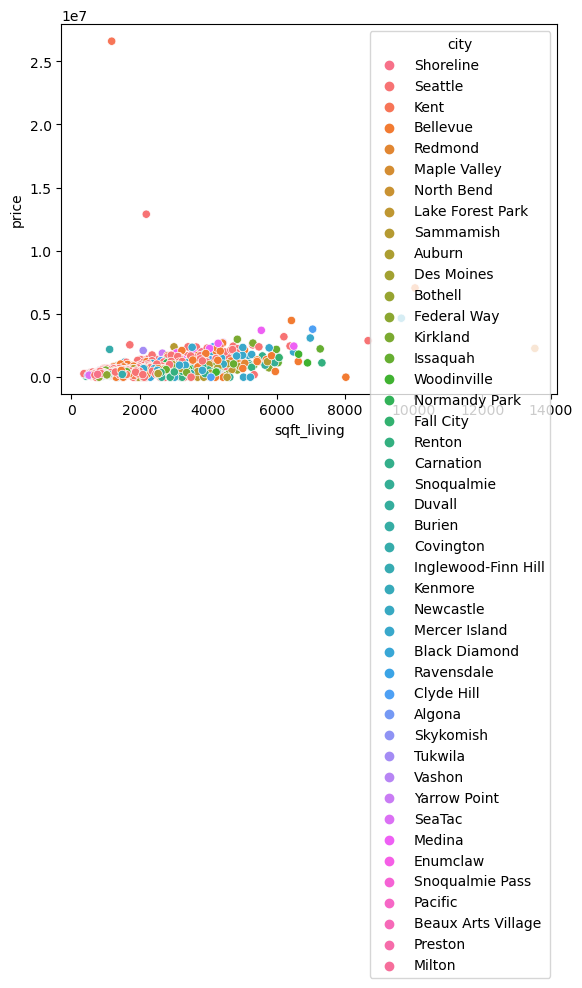

In [10]:
sns.scatterplot(data=data, x='sqft_living', y='price', hue='city')

***Correlogram***

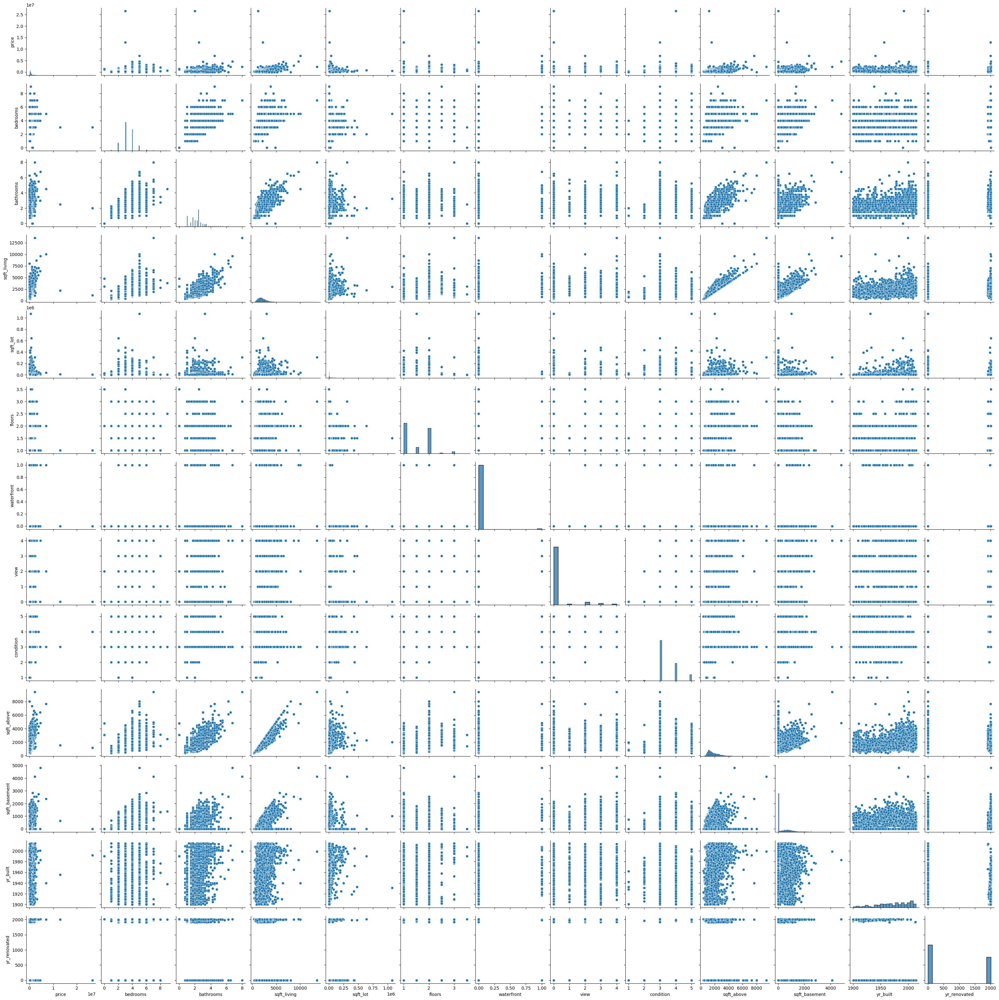

In [37]:
sns.pairplot(data=data)

***Correlating Matrix***

In [7]:
!pip install pandas_profiling

  Using cached pandas_profiling-3.5.0-py2.py3-none-any.whl (325 kB)
  Using cached phik-0.12.2-cp39-cp39-macosx_10_13_x86_64.whl (694 kB)
  Using cached pydantic-1.10.2-cp39-cp39-macosx_10_9_x86_64.whl (3.2 MB)
  Using cached typeguard-2.13.3-py3-none-any.whl (17 kB)
  Using cached multimethod-1.9-py3-none-any.whl (10 kB)
  Using cached htmlmin-0.1.12-py3-none-any.whl
  Using cached visions-0.7.5-py3-none-any.whl (102 kB)
  Using cached tangled_up_in_unicode-0.2.0-py3-none-any.whl (4.7 MB)
  Using cached ImageHash-4.3.1-py2.py3-none-any.whl (296 kB)


In [8]:
from pandas_profiling import ProfileReport
report = ProfileReport(data)
report #or

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

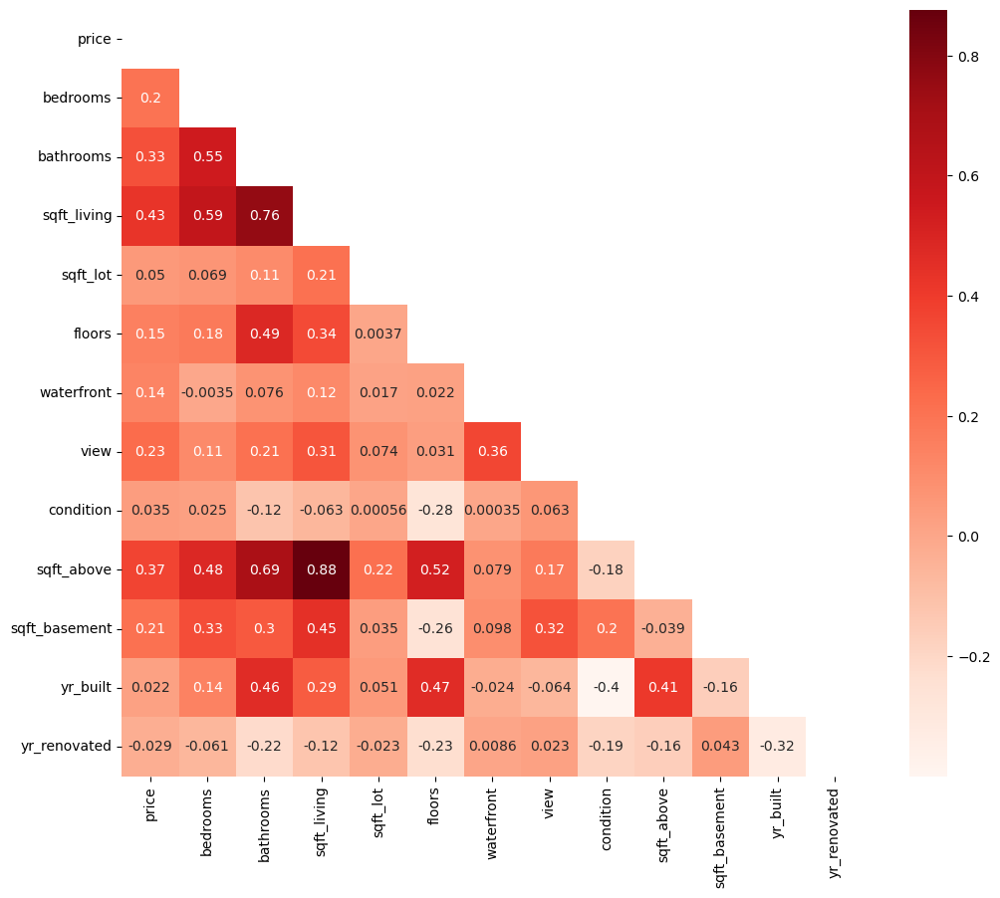

In [38]:
plt.figure(figsize=(12,10))
cor = data.corr()
mask = np.triu(np.ones_like(cor))
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds, mask=mask)
plt.show()

<AxesSubplot:>

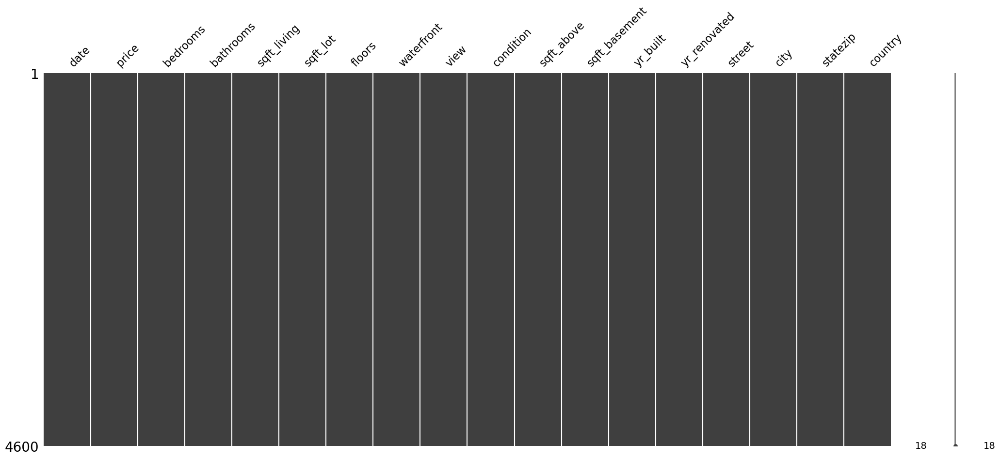

In [39]:
import missingno as msno
msno.matrix(data)

In [21]:
!pip install folium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 964.8 kB/s eta 0:00:00 0:00:01


In [23]:
import folium
import math
import plotly.graph_objects as go
import plotly.express as px
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

city_map = folium.Map(location=[28.69,76.95], zoom_start=10, tiles='Stamen Terrain')
mc = MarkerCluster()
for idx, row in data.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        popup = """
        Location : <b>%s</b><br>
        Price : <b>%s</b><br>
        """ % (row['Location'], row['Price'])
        mc.add_child(Marker([row['Latitude'], row['Longitude']],tooltip=popup))
    city_map.add_child(mc)
city_map

KeyError: 'Longitude'